# Frequent Pattern Mining 

## CCSR codes

### Imports

In [1]:
#!pip install mlxtend

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import math
import statistics
from scipy import stats
import scipy.stats
from scipy.stats import norm
import plotly.express as px
import seaborn as sns
import mlxtend.frequent_patterns
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules, fpgrowth
import warnings
warnings.filterwarnings('ignore')

### Admissions

In [3]:
# Hospital admissions
adm = pd.read_csv('admissions.csv.gz', compression='gzip')

### Patients

In [4]:
# Read the file
patient = pd.read_csv('patients.csv.gz', compression='gzip')

In [5]:
#patient.head(3)

### ICD codes for Diagnoses

In [6]:
# icd_codes for diagnoses
icd_diag = pd.read_csv('d_icd_diagnoses.csv.gz', compression='gzip')

In [7]:
#icd_diag.head(3)

### Patients Diagnoses ICD

In [8]:
# Patients diagnoses icd
diag_icd = pd.read_csv('diagnoses_icd.csv.gz', compression='gzip')

In [9]:
#diag_icd.head()

### Patients Diagnoses CCSR

In [10]:
# Patients diagnoses icd
diag_ccsr = pd.read_csv('diagnoses_ccsr.csv')

In [11]:
diag_ccsr.head(3)

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System
0,10000084,23052089,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system
1,10110584,24580984,5,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system
2,10229302,26194242,14,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system


## Frequent Pattern Mining 

### Patients diagnoses CCSR 

In [12]:
# Patients diagnoses CCSR dummies
#diag_ccsr_ = pd.read_csv('ccsr_diag_dummies.csv')
#diag_ccsr_.head()

In [13]:
#ccsr_=diag_ccsr_.drop(columns=["subject_id"])

In [14]:
# It has to be done in other way
# CCSR codes

In [15]:
df1 = diag_ccsr.set_index(['subject_id', diag_ccsr.groupby('subject_id').cumcount()])['ccsr_code'].unstack().add_prefix('N.').reset_index()
df1=df1.stack().groupby(level=0).apply(list).tolist()

In [16]:
subject_ids_df1 = [df1[sublist][0] for sublist in range(len(df1))]
for sublist in df1:
    del sublist[0]

In [17]:
tr_enc = TransactionEncoder()
tr_array = tr_enc.fit(df1).transform(df1)
df_binary=pd.DataFrame(tr_array,columns=[str(i) for i in tr_enc.columns_])

In [18]:
#df_binary = df_binary.replace(False,0)
#df_binary = df_binary.replace(True,1)

In [19]:
FI_fpg = fpgrowth(df_binary, min_support=0.005, use_colnames=True)

In [20]:
FI_fpg.sort_values(["support"], ascending=False)

,support,itemsets
0,0.479523,(FAC021)
7,0.412557,(FAC025)
44,0.367736,(CIR007)
1,0.358846,(END010)
8,0.331598,(EXT027)
...,...,...
291999,0.005011,"(SYM013, DIG025, RSP012, END010, FAC025)"
608313,0.005011,"(INF002, CIR019, END001, EXT027)"
291997,0.005011,"(SYM013, DIG025, END011, RSP012, BLD003, FAC025)"
991442,0.005011,"(INF002, EXT027, END011, RSP012, CIR009, FAC025)"


In [21]:
rules_fpg = association_rules(FI_fpg, metric="confidence", min_threshold=0.9)

In [22]:
rules_sort = rules_fpg.sort_values(["confidence", "lift"], ascending=False)

In [23]:
pd.DataFrame(rules_sort).head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
1368922,(PRG022),"(PRG002, PRG030)",0.007655,0.055085,0.007655,1.0,18.153637,0.007233,inf,0.952204
1368927,"(PRG022, PRG023)","(PRG002, PRG030)",0.005300,0.055085,0.005300,1.0,18.153637,0.005008,inf,0.949949
1368918,(PRG022),(PRG030),0.007655,0.055166,0.007655,1.0,18.127041,0.007233,inf,0.952122
1368920,"(PRG022, PRG002)",(PRG030),0.007655,0.055166,0.007655,1.0,18.127041,0.007233,inf,0.952122
1368923,"(PRG022, PRG023)",(PRG030),0.005300,0.055166,0.005300,1.0,18.127041,0.005007,inf,0.949868
1368925,"(PRG022, PRG023, PRG002)",(PRG030),0.005300,0.055166,0.005300,1.0,18.127041,0.005007,inf,0.949868
1370009,"(PRG023, PRG016)",(PRG030),0.005761,0.055166,0.005761,1.0,18.127041,0.005444,inf,0.950309
1370011,"(PRG023, PRG016, PRG002)",(PRG030),0.005750,0.055166,0.005750,1.0,18.127041,0.005433,inf,0.950298
1187366,"(PRG030, RSP009)",(PRG002),0.005727,0.057949,0.005727,1.0,17.256625,0.005395,inf,0.947477
1187400,"(PRG023, RSP009, PRG030)",(PRG002),0.005184,0.057949,0.005184,1.0,17.256625,0.004884,inf,0.946960


#### CCSR description

In [24]:
df0 = diag_ccsr.set_index(['subject_id', diag_ccsr.groupby('subject_id').cumcount()])['diagnose'].unstack().add_prefix('N.').reset_index()
df0=df0.stack().groupby(level=0).apply(list).tolist()

In [25]:
subject_ids_df0 = [df0[sublist][0] for sublist in range(len(df0))]
for sublist in df0:
    del sublist[0]

In [26]:
tr_enc = TransactionEncoder()
tr_array_0 = tr_enc.fit(df0).transform(df0)
df_binary_0=pd.DataFrame(tr_array_0,columns=[str(i) for i in tr_enc.columns_])

In [27]:
FI_fpg_0 = fpgrowth(df_binary_0, min_support=0.01, use_colnames=True)

In [28]:
FI_fpg_0.sort_values(["support"], ascending=False)

,support,itemsets
43,0.363938,(Essential (primary) hypertension)
0,0.322165,"(Hyperlipidemia, unspecified)"
5,0.246574,(Personal history of nicotine dependence)
6,0.220145,(Gastro-esophageal reflux disease without esop...
319,0.196234,"(Hyperlipidemia, unspecified, Essential (prima..."
...,...,...
2400,0.010010,"(Hyperlipidemia, unspecified, Personal history..."
2724,0.010010,"(Paroxysmal atrial fibrillation, Obstructive s..."
786,0.010010,(Gastro-esophageal reflux disease without esop...
2754,0.010010,(Long term (current) use of antithrombotics/an...


In [29]:
rules_fpg_0 = association_rules(FI_fpg_0, metric="confidence", min_threshold=0.95)

In [30]:
rules_sort_0 = rules_fpg_0.sort_values(["confidence", "lift"], ascending=False)

In [31]:
pd.DataFrame(rules_sort_0)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
50,(Hypocalcemia),(Other and unspecified fall in water transport...,0.010945,0.010945,0.010945,1.000000,91.361814,0.010826,inf,1.000000
51,(Other and unspecified fall in water transport...,(Hypocalcemia),0.010945,0.010945,0.010945,1.000000,91.361814,0.010826,inf,1.000000
0,(Hypomagnesemia),(Other fall from one level to another in water...,0.023992,0.023992,0.023992,1.000000,41.679981,0.023417,inf,1.000000
1,(Other fall from one level to another in water...,(Hypomagnesemia),0.023992,0.023992,0.023992,1.000000,41.679981,0.023417,inf,1.000000
2,"(Hypomagnesemia, Essential (primary) hypertens...",(Other fall from one level to another in water...,0.013693,0.023992,0.013693,1.000000,41.679981,0.013365,inf,0.989558
3,"(Essential (primary) hypertension, Other fall ...",(Hypomagnesemia),0.013693,0.023992,0.013693,1.000000,41.679981,0.013365,inf,0.989558
4,"(Hypomagnesemia, Hypokalemia)",(Other fall from one level to another in water...,0.011661,0.023992,0.011661,1.000000,41.679981,0.011382,inf,0.987524
5,"(Hypokalemia, Other fall from one level to ano...",(Hypomagnesemia),0.011661,0.023992,0.011661,1.000000,41.679981,0.011382,inf,0.987524
6,"(Hyperlipidemia, unspecified, Hypomagnesemia)",(Other fall from one level to another in water...,0.011592,0.023992,0.011592,1.000000,41.679981,0.011314,inf,0.987454
7,"(Hyperlipidemia, unspecified, Other fall from ...",(Hypomagnesemia),0.011592,0.023992,0.011592,1.000000,41.679981,0.011314,inf,0.987454


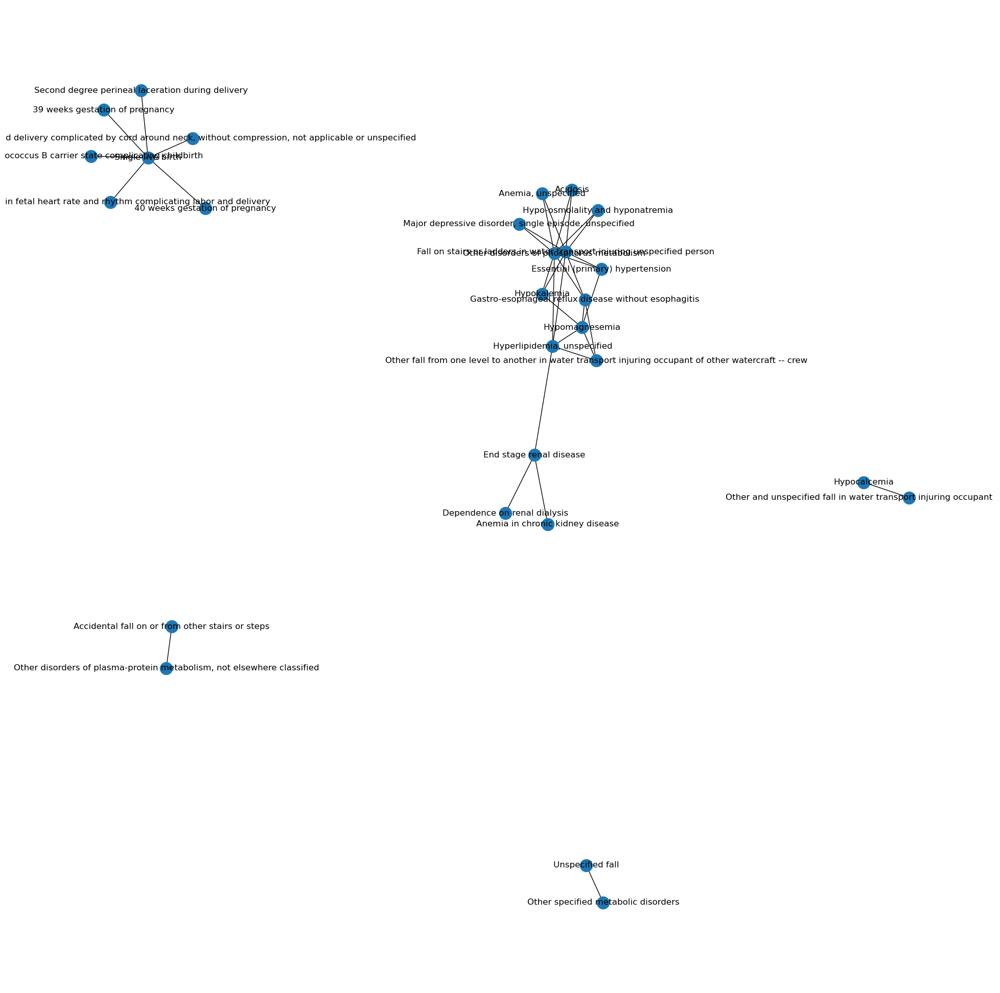

In [32]:
import networkx as nx
# Convert antecedents and consequents into strings
rules_fpg_0.antecedents = rules_fpg_0.antecedents.apply(lambda x: next(iter(x)))
rules_fpg_0.consequents = rules_fpg_0.consequents.apply(lambda x: next(iter(x)))

fig, ax=plt.subplots(figsize=(25,25))
GA=nx.from_pandas_edgelist(rules_fpg_0,source='antecedents',target='consequents')
nx.draw(GA,with_labels=True)
plt.show()

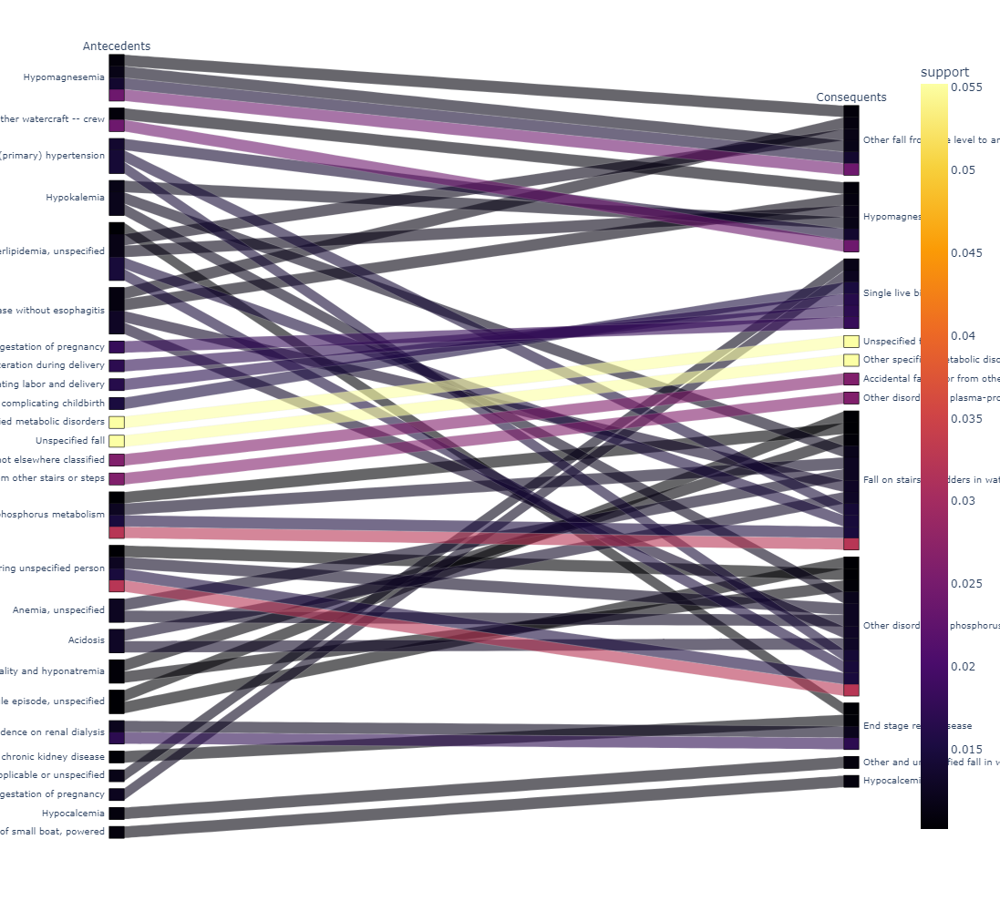

In [33]:
import plotly.express as px
pd.DataFrame.iteritems = pd.DataFrame.items

fig = px.parallel_categories(
    rules_fpg_0, 
    dimensions=['antecedents', 'consequents'],
    color="support", 
    color_continuous_scale=px.colors.sequential.Inferno,
    labels={'antecedents':'Antecedents', 'consequents':'Consequents'},
    width=1500, height=1000,
)
fig.show()

### Clusters CCSR Description

In [34]:
ccsr_clus=pd.read_csv('pat_diag_ccsr_clus.csv')

In [35]:
ccsr_clus.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means
0,10000084,23052089,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
1,10000084,23052089,2,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
2,10000084,29888819,3,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
3,10000084,23052089,3,R441,10,SYM015,Visual hallucinations,General sensation/perception signs and symptoms,General sensation/perception signs and symptom...,"SYM: Symptoms, signs and abnormal clinical and...",1
4,10000084,23052089,4,R296,10,SYM016,Repeated falls,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",1


#### Cluster 1

In [36]:
# Selecting only women
ccsr_clus_1 = ccsr_clus[ccsr_clus["k_means"] == 0 ]
ccsr_clus_1.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means
121,10324973,27240180,8,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
122,10324973,29163480,3,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
123,10324973,29163480,8,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
124,10324973,25404910,2,F05,10,NVS011,Delirium due to known physiological condition,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
125,10324973,25404910,1,F0390,10,NVS011,Unspecified dementia without behavioral distur...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0


In [37]:
cl1= ccsr_clus_1.set_index(['subject_id', ccsr_clus_1.groupby('subject_id').cumcount()])['diagnose'].unstack().add_prefix('N.').reset_index()
cl1=cl1.stack().groupby(level=0).apply(list).tolist()
subject_ids_cl1 = [cl1[sublist][0] for sublist in range(len(cl1))]
for sublist in cl1:
    del sublist[0]

In [38]:
tr_enc = TransactionEncoder()
tr_array_cl1 = tr_enc.fit(cl1).transform(cl1)
df_binary_cl1=pd.DataFrame(tr_array_cl1,columns=[str(i) for i in tr_enc.columns_])
df_binary_cl1 = df_binary_cl1.replace(False,0)
FI_fpg_cl1 = fpgrowth(df_binary_cl1, min_support=0.05, use_colnames=True)
FI_fpg_cl1.sort_values(["support"], ascending=False)

,support,itemsets
0,0.694714,"(Hyperlipidemia, unspecified)"
1,0.603464,(Personal history of nicotine dependence)
30,0.567145,(Essential (primary) hypertension)
31,0.545302,"(Acute kidney failure, unspecified)"
2,0.529016,(Gastro-esophageal reflux disease without esop...
...,...,...
1307,0.050019,(Atherosclerotic heart disease of native coron...
3280,0.050019,"(Anemia, unspecified, Thrombocytopenia, unspec..."
5238,0.050019,(Atherosclerotic heart disease of native coron...
4861,0.050019,"(Diarrhea, unspecified, Anemia, unspecified, A..."


In [39]:
rules_fpg_cl1 = association_rules(FI_fpg_cl1, metric="confidence", min_threshold=0.95)
rules_sort_cl1 = rules_fpg_cl1.sort_values(["confidence", "lift"], ascending=False)
pd.DataFrame(rules_sort_cl1) #.sort_values(["zhangs_metric"], ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
56,(Hypomagnesemia),(Other fall from one level to another in water...,0.105984,0.105984,0.105984,1.000000,9.435366,0.094752,inf,1.000000
57,(Other fall from one level to another in water...,(Hypomagnesemia),0.105984,0.105984,0.105984,1.000000,9.435366,0.094752,inf,1.000000
58,"(Hypomagnesemia, Essential (primary) hypertens...",(Other fall from one level to another in water...,0.066176,0.105984,0.066176,1.000000,9.435366,0.059162,inf,0.957370
59,"(Essential (primary) hypertension, Other fall ...",(Hypomagnesemia),0.066176,0.105984,0.066176,1.000000,9.435366,0.059162,inf,0.957370
60,"(Hypomagnesemia, Acute kidney failure, unspeci...",(Other fall from one level to another in water...,0.064366,0.105984,0.064366,1.000000,9.435366,0.057544,inf,0.955519
...,...,...,...,...,...,...,...,...,...,...
12,(Gastro-esophageal reflux disease without esop...,(Atherosclerotic heart disease of native coron...,0.071604,0.456120,0.068114,0.951264,2.085556,0.035454,11.159613,0.560657
83,"(Presence of aortocoronary bypass graft, Unspe...",(Atherosclerotic heart disease of native coron...,0.052734,0.456120,0.050149,0.950980,2.084935,0.026096,11.095153,0.549337
92,"(Chronic systolic (congestive) heart failure, ...",(Atherosclerotic heart disease of native coron...,0.065917,0.456120,0.062686,0.950980,2.084935,0.032620,11.095153,0.557090
5,(Presence of coronary angioplasty implant and ...,(Atherosclerotic heart disease of native coron...,0.110508,0.456120,0.105079,0.950877,2.084709,0.054675,11.071844,0.584959


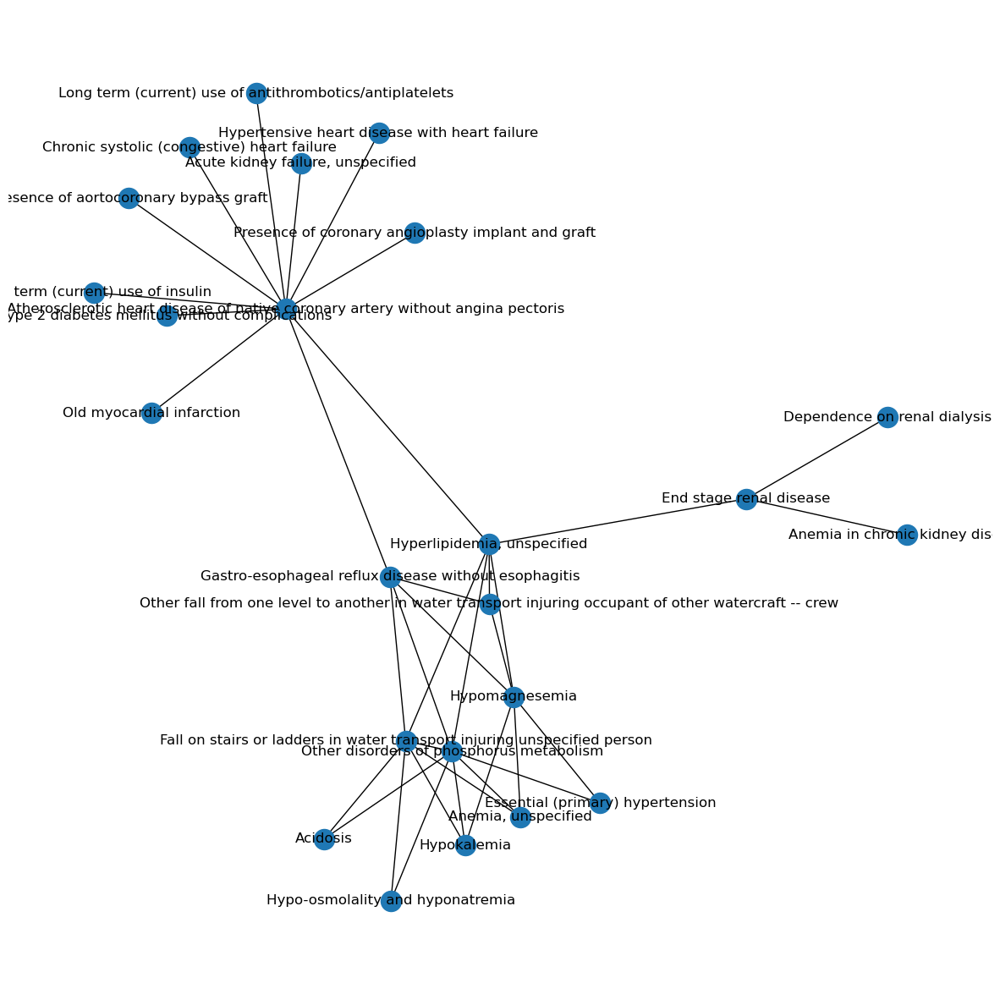

In [40]:
import networkx as nx
# Convert antecedents and consequents into strings
rules_fpg_cl1.antecedents = rules_fpg_cl1.antecedents.apply(lambda x: next(iter(x)))
rules_fpg_cl1.consequents = rules_fpg_cl1.consequents.apply(lambda x: next(iter(x)))

fig, ax=plt.subplots(figsize=(15,15))
GA=nx.from_pandas_edgelist(rules_fpg_cl1,source='antecedents',target='consequents')
nx.draw(GA,with_labels=True)
plt.show()

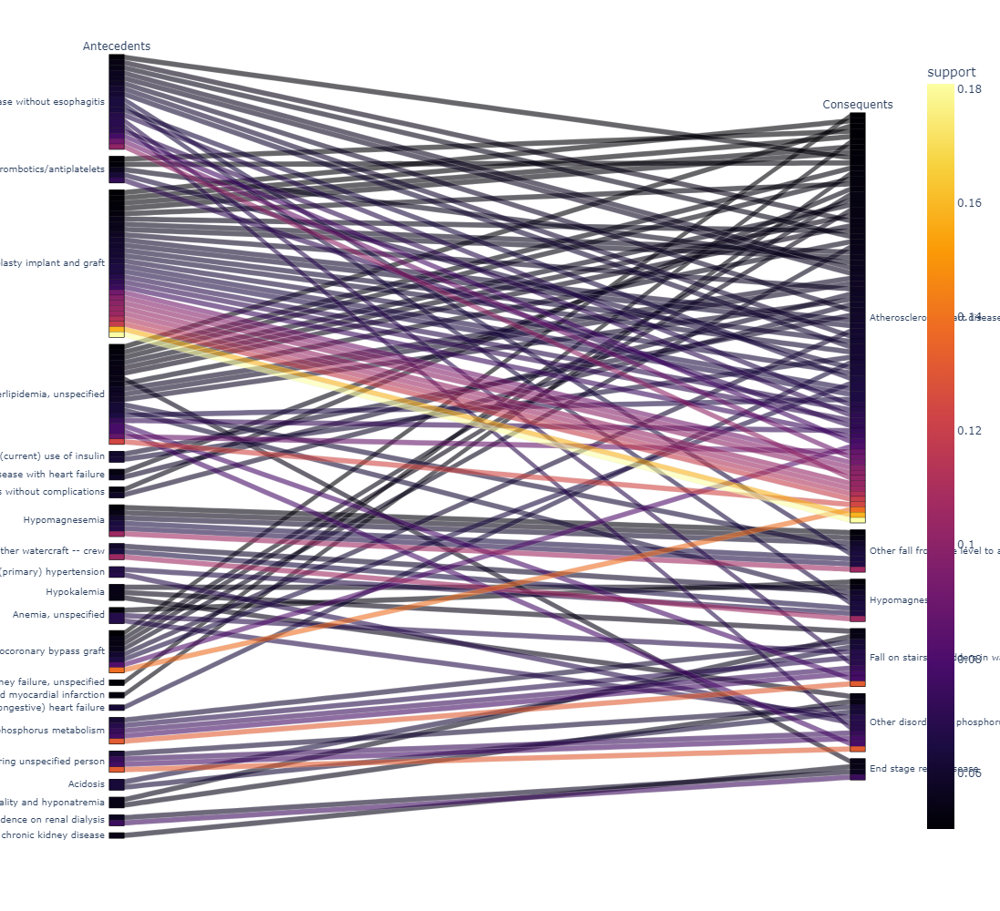

In [41]:
import plotly.express as px
pd.DataFrame.iteritems = pd.DataFrame.items

fig = px.parallel_categories(
    rules_fpg_cl1, 
    dimensions=['antecedents', 'consequents'],
    color="support", 
    color_continuous_scale=px.colors.sequential.Inferno,
    labels={'antecedents':'Antecedents', 'consequents':'Consequents'},
    width=1500, height=1000,
)
fig.show()

#### Cluster 2

In [42]:
# Selecting only women
ccsr_clus_2 = ccsr_clus[ccsr_clus["k_means"] == 1 ]
ccsr_clus_2.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means
0,10000084,23052089,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
1,10000084,23052089,2,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
2,10000084,29888819,3,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
3,10000084,23052089,3,R441,10,SYM015,Visual hallucinations,General sensation/perception signs and symptoms,General sensation/perception signs and symptom...,"SYM: Symptoms, signs and abnormal clinical and...",1
4,10000084,23052089,4,R296,10,SYM016,Repeated falls,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",1


In [43]:
cl2= ccsr_clus_2.set_index(['subject_id', ccsr_clus_2.groupby('subject_id').cumcount()])['diagnose'].unstack().add_prefix('N.').reset_index()
cl2=cl2.stack().groupby(level=0).apply(list).tolist()

In [44]:
subject_ids_cl2 = [cl2[sublist][0] for sublist in range(len(cl2))]
for sublist in cl2:
    del sublist[0]

In [45]:
tr_enc = TransactionEncoder()
tr_array_cl2 = tr_enc.fit(cl2).transform(cl2)
df_binary_cl2=pd.DataFrame(tr_array_cl2,columns=[str(i) for i in tr_enc.columns_])
df_binary_cl2 = df_binary_cl2.replace(False,0)

In [46]:
FI_fpg_cl2 = fpgrowth(df_binary_cl2, min_support=0.1, use_colnames=True)
FI_fpg_cl2.sort_values(["support"], ascending=False)

,support,itemsets
7,0.346532,(Essential (primary) hypertension)
0,0.284450,"(Hyperlipidemia, unspecified)"
1,0.210340,(Personal history of nicotine dependence)
2,0.187244,(Gastro-esophageal reflux disease without esop...
11,0.173765,"(Hyperlipidemia, unspecified, Essential (prima..."
8,0.170719,"(Major depressive disorder, single episode, un..."
3,0.148310,"(Anxiety disorder, unspecified)"
4,0.121948,(Atherosclerotic heart disease of native coron...
10,0.111644,"(Acute kidney failure, unspecified)"
5,0.105656,(Unspecified place or not applicable)


In [47]:
rules_fpg_cl2 = association_rules(FI_fpg_cl2, metric="confidence", min_threshold=0.2)
rules_sort_cl2 = rules_fpg_cl2.sort_values(["confidence", "lift"], ascending=False)

In [48]:
rules_sort_cl2=pd.DataFrame(rules_sort_cl2).sort_values("zhangs_metric", ascending=False).head(300)
rules_sort_cl2

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
1,(Essential (primary) hypertension),"(Hyperlipidemia, unspecified)",0.346532,0.284450,0.173765,0.501440,1.762842,0.075194,1.435234,0.662212
0,"(Hyperlipidemia, unspecified)",(Essential (primary) hypertension),0.284450,0.346532,0.173765,0.610881,1.762842,0.075194,1.679352,0.604757
2,(Essential (primary) hypertension),(Personal history of nicotine dependence),0.346532,0.210340,0.101016,0.291506,1.385880,0.028127,1.114561,0.426091
3,(Personal history of nicotine dependence),(Essential (primary) hypertension),0.210340,0.346532,0.101016,0.480251,1.385880,0.028127,1.257278,0.352604


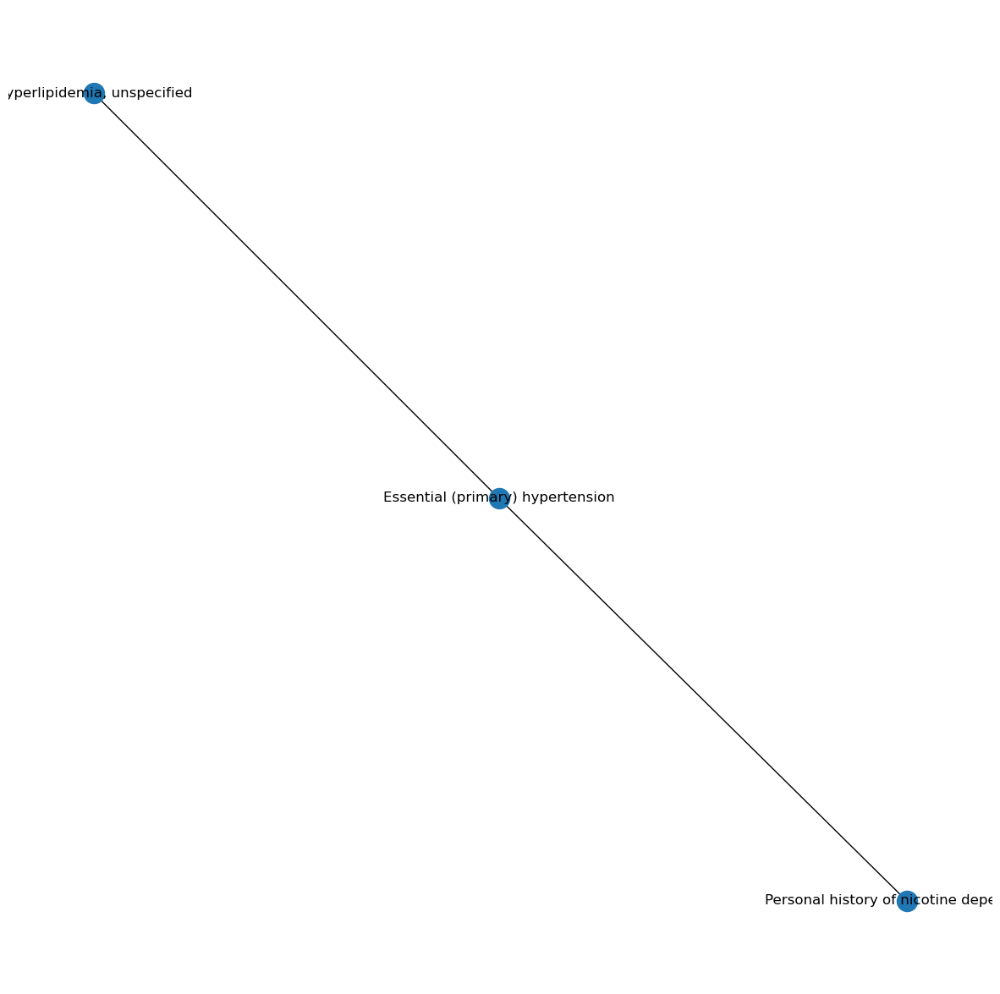

In [49]:
import networkx as nx
# Convert antecedents and consequents into strings
rules_fpg_cl2.antecedents = rules_fpg_cl2.antecedents.apply(lambda x: next(iter(x)))
rules_fpg_cl2.consequents = rules_fpg_cl2.consequents.apply(lambda x: next(iter(x)))

fig, ax=plt.subplots(figsize=(15,15))
GA=nx.from_pandas_edgelist(rules_fpg_cl2,source='antecedents',target='consequents')
nx.draw(GA,with_labels=True)
plt.show()

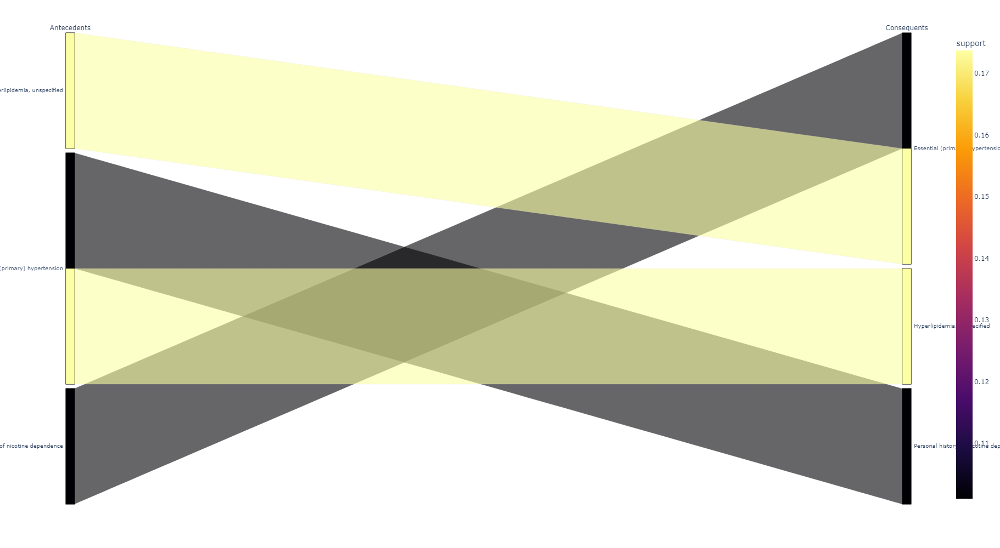

In [50]:
import plotly.express as px
pd.DataFrame.iteritems = pd.DataFrame.items

fig = px.parallel_categories(
    rules_fpg_cl2, 
    dimensions=['antecedents', 'consequents'],
    color="support", 
    color_continuous_scale=px.colors.sequential.Inferno,
    labels={'antecedents':'Antecedents', 'consequents':'Consequents'},
    width=1500, height=1000,
)
fig.show()

#### Cluster 3

In [51]:
# Selecting only cluster 3 patients
ccsr_clus_3 = ccsr_clus[ccsr_clus["k_means"] == 2 ]
ccsr_clus_3.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means
1513,12208824,21476079,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,2
1514,12208824,21476079,2,F0281,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,2
1515,12208824,21337362,1,R42,10,SYM015,Dizziness and giddiness,General sensation/perception signs and symptoms,General sensation/perception signs and symptom...,"SYM: Symptoms, signs and abnormal clinical and...",2
1516,12208824,24422500,18,R42,10,SYM015,Dizziness and giddiness,General sensation/perception signs and symptoms,General sensation/perception signs and symptom...,"SYM: Symptoms, signs and abnormal clinical and...",2
1517,12208824,24422500,10,R627,10,SYM016,Adult failure to thrive,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",2


In [52]:
cl3= ccsr_clus_3.set_index(['subject_id', ccsr_clus_3.groupby('subject_id').cumcount()])['diagnose'].unstack().add_prefix('N.').reset_index()
cl3=cl3.stack().groupby(level=0).apply(list).tolist()

In [53]:
subject_ids_cl3 = [cl3[sublist][0] for sublist in range(len(cl3))]
for sublist in cl3:
    del sublist[0]

In [54]:
tr_enc = TransactionEncoder()
tr_array_cl3 = tr_enc.fit(cl3).transform(cl3)
df_binary_cl3=pd.DataFrame(tr_array_cl3,columns=[str(i) for i in tr_enc.columns_])
df_binary_cl3 = df_binary_cl3.replace(False,0)

In [55]:
FI_fpg_cl3 = fpgrowth(df_binary_cl3, min_support=0.1, use_colnames=True)
FI_fpg_cl3.sort_values(["support"], ascending=False)

,support,itemsets
0,0.826458,"(Hyperlipidemia, unspecified)"
1,0.798009,"(Acute kidney failure, unspecified)"
2,0.788051,"(Anemia, unspecified)"
3,0.748222,(Gastro-esophageal reflux disease without esop...
4,0.738265,(Unspecified place or not applicable)
...,...,...
74435,0.100996,"(Chronic kidney disease, unspecified, Unspecif..."
74463,0.100996,(Unspecified place in unspecified non-institut...
74474,0.100996,(Unspecified place in unspecified non-institut...
74478,0.100996,(Unspecified place in unspecified non-institut...


In [56]:
rules_fpg_cl3 = association_rules(FI_fpg_cl3, metric="confidence", min_threshold=1)
rules_sort_cl3 = rules_fpg_cl3.sort_values(["confidence", "lift"], ascending=False)

In [57]:
rules_sort_cl3=pd.DataFrame(rules_sort_cl3).sort_values("zhangs_metric", ascending=False).head(300)
rules_sort_cl3

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
14544,(Hypocalcemia),(Other and unspecified fall in water transport...,0.110953,0.110953,0.110953,1.0,9.012821,0.098642,inf,1.000000
11781,(Other fall from one level to another in water...,(Hypomagnesemia),0.173542,0.173542,0.173542,1.0,5.762295,0.143425,inf,1.000000
11780,(Hypomagnesemia),(Other fall from one level to another in water...,0.173542,0.173542,0.173542,1.0,5.762295,0.143425,inf,1.000000
14545,(Other and unspecified fall in water transport...,(Hypocalcemia),0.110953,0.110953,0.110953,1.0,9.012821,0.098642,inf,1.000000
12410,(Other disorders of phosphorus metabolism),(Fall on stairs or ladders in water transport ...,0.332859,0.332859,0.332859,1.0,3.004274,0.222064,inf,1.000000
...,...,...,...,...,...,...,...,...,...,...
10031,"(Anemia in chronic kidney disease, Dependence ...",(End stage renal disease),0.155050,0.310100,0.155050,1.0,3.224771,0.106969,inf,0.816498
11378,(Gastro-esophageal reflux disease without esop...,(End stage renal disease),0.155050,0.310100,0.155050,1.0,3.224771,0.106969,inf,0.816498
11283,"(Hyperlipidemia, unspecified, Hypertensive chr...",(End stage renal disease),0.155050,0.310100,0.155050,1.0,3.224771,0.106969,inf,0.816498
11331,"(Anemia in chronic kidney disease, Dependence ...",(End stage renal disease),0.155050,0.310100,0.155050,1.0,3.224771,0.106969,inf,0.816498


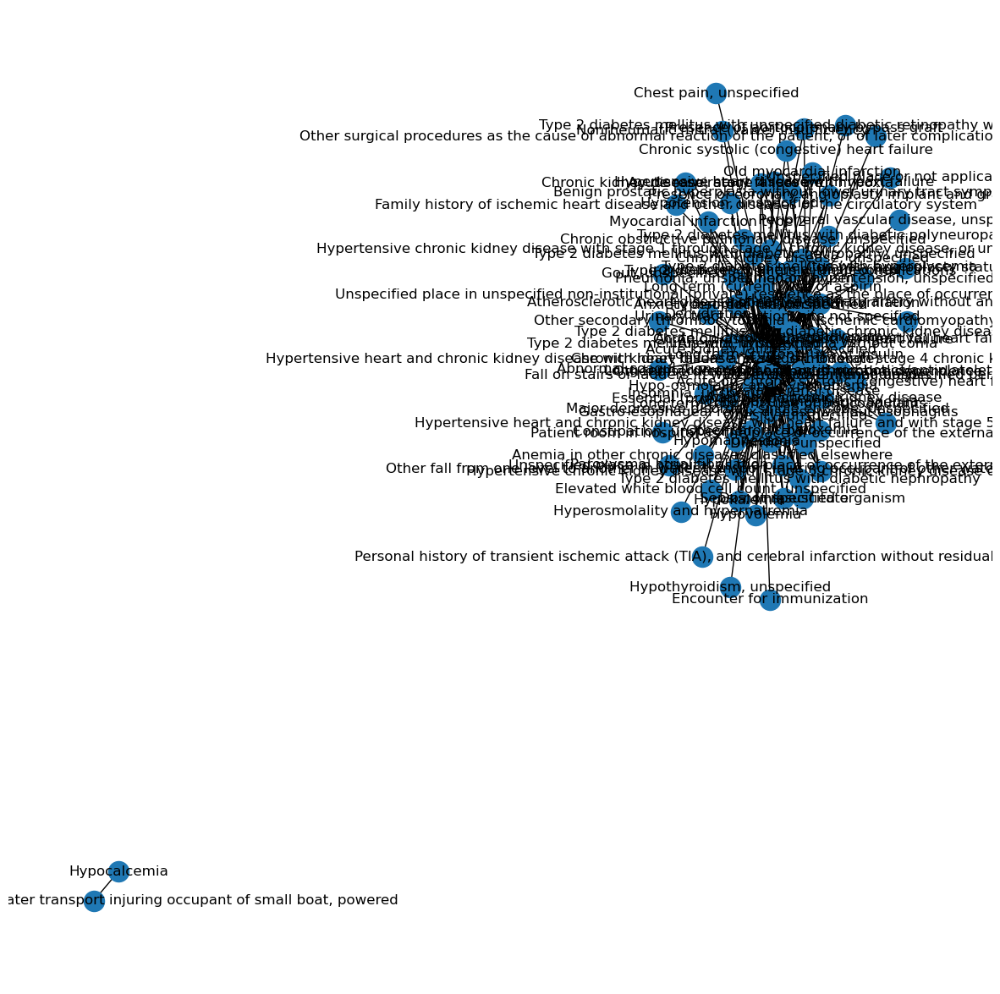

In [58]:
import networkx as nx
# Convert antecedents and consequents into strings
rules_fpg_cl3.antecedents = rules_fpg_cl3.antecedents.apply(lambda x: next(iter(x)))
rules_fpg_cl3.consequents = rules_fpg_cl3.consequents.apply(lambda x: next(iter(x)))

fig, ax=plt.subplots(figsize=(15,15))
GA=nx.from_pandas_edgelist(rules_fpg_cl3,source='antecedents',target='consequents')
nx.draw(GA,with_labels=True)
plt.show()

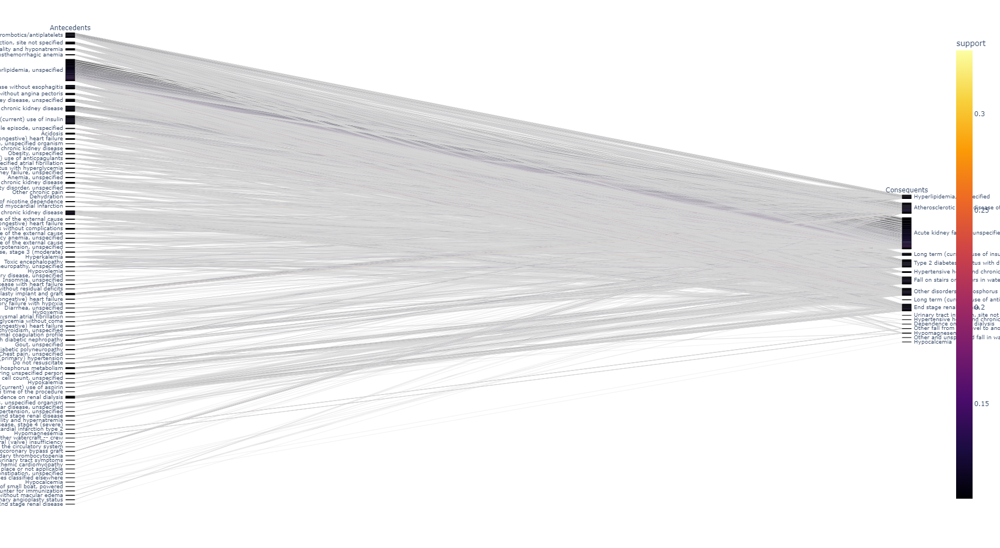

In [59]:
import plotly.express as px
pd.DataFrame.iteritems = pd.DataFrame.items

fig = px.parallel_categories(
    rules_fpg_cl3, 
    dimensions=['antecedents', 'consequents'],
    color="support", 
    color_continuous_scale=px.colors.sequential.Inferno,
    labels={'antecedents':'Antecedents', 'consequents':'Consequents'},
    width=1500, height=1000,
)
fig.show()

### Scaled DATA | CCSR codes

In [60]:
ccsr_clus=pd.read_csv('pat_diag_ccsr_clus_scaled.csv')

In [61]:
ccsr_clus.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
0,10000084,23052089,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
1,10000084,23052089,2,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
2,10000084,29888819,3,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
3,10000084,23052089,3,R441,10,SYM015,Visual hallucinations,General sensation/perception signs and symptoms,General sensation/perception signs and symptom...,"SYM: Symptoms, signs and abnormal clinical and...",1
4,10000084,23052089,4,R296,10,SYM016,Repeated falls,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",1


#### Cluster 1

In [62]:
# Selecting only cluster 1 patients
ccsr_clus_1 = ccsr_clus[ccsr_clus["k_means_5"] == 0 ]
ccsr_clus_1

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
1049,11443963,20635866,4,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
1050,11443963,21850080,14,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
1051,11443963,23920288,4,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
1052,11443963,25158456,14,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
1053,11443963,25247780,9,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
...,...,...,...,...,...,...,...,...,...,...,...
1792605,18171767,27054528,14,F609,10,MBD009,"Personality disorder, unspecified",Personality disorders,Other mental and substance use disorders,"MBD: Mental, behavioral and neurodevelopmental...",0
1792606,18171767,23719441,16,R451,10,SYM008,Restlessness and agitation,Symptoms of mental and substance use conditions,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",0
1792607,18171767,23719441,18,F913,10,MBD008,Oppositional defiant disorder,"Disruptive, impulse-control and conduct disorders",Other mental and substance use disorders,"MBD: Mental, behavioral and neurodevelopmental...",0
1792608,18171767,22651661,7,D7589,10,BLD010,Other specified diseases of blood and blood-fo...,Other specified and unspecified hematologic co...,Other disorders of blood and immune system,BLD: Diseases of the blood and blood-forming o...,0


In [63]:
cl1= ccsr_clus_1.set_index(['subject_id', ccsr_clus_1.groupby('subject_id').cumcount()])['diagnose'].unstack().add_prefix('N.').reset_index()
cl1=cl1.stack().groupby(level=0).apply(list).tolist()
subject_ids_cl1 = [cl1[sublist][0] for sublist in range(len(cl1))]
for sublist in cl1:
    del sublist[0]

In [64]:
tr_enc = TransactionEncoder()
tr_array_cl1 = tr_enc.fit(cl1).transform(cl1)
df_binary_cl1=pd.DataFrame(tr_array_cl1,columns=[str(i) for i in tr_enc.columns_])
df_binary_cl1 = df_binary_cl1.replace(False,0)
FI_fpg_cl1 = fpgrowth(df_binary_cl1, min_support=0.2, use_colnames=True)
FI_fpg_cl1.sort_values(["support"], ascending=False)

,support,itemsets
0,0.766397,"(Acute kidney failure, unspecified)"
26,0.764600,(Gastro-esophageal reflux disease without esop...
1,0.759209,"(Anemia, unspecified)"
27,0.749326,(Unspecified place or not applicable)
2,0.745732,"(Hyperlipidemia, unspecified)"
...,...,...
1789,0.200359,(Gastro-esophageal reflux disease without esop...
1209,0.200359,"(Acidosis, Long term (current) use of insulin,..."
225,0.200359,(Atherosclerotic heart disease of native coron...
2199,0.200359,(Gastro-esophageal reflux disease without esop...


In [65]:
rules_fpg_cl1 = association_rules(FI_fpg_cl1, metric="confidence", min_threshold=1)
rules_sort_cl1 = rules_fpg_cl1.sort_values(["confidence", "lift"], ascending=False)
pd.DataFrame(rules_sort_cl1) #.sort_values(["zhangs_metric"], ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
1,(Hypomagnesemia),(Other fall from one level to another in water...,0.206649,0.206649,0.206649,1.0,4.83913,0.163945,inf,1.000000
2,(Other fall from one level to another in water...,(Hypomagnesemia),0.206649,0.206649,0.206649,1.0,4.83913,0.163945,inf,1.000000
3,(Other disorders of phosphorus metabolism),(Fall on stairs or ladders in water transport ...,0.314465,0.314465,0.314465,1.0,3.18000,0.215577,inf,1.000000
4,(Fall on stairs or ladders in water transport ...,(Other disorders of phosphorus metabolism),0.314465,0.314465,0.314465,1.0,3.18000,0.215577,inf,1.000000
5,"(Anemia, unspecified, Fall on stairs or ladder...",(Other disorders of phosphorus metabolism),0.247080,0.314465,0.247080,1.0,3.18000,0.169382,inf,0.910501
6,"(Anemia, unspecified, Other disorders of phosp...",(Fall on stairs or ladders in water transport ...,0.247080,0.314465,0.247080,1.0,3.18000,0.169382,inf,0.910501
7,(Gastro-esophageal reflux disease without esop...,(Fall on stairs or ladders in water transport ...,0.238994,0.314465,0.238994,1.0,3.18000,0.163838,inf,0.900826
8,(Gastro-esophageal reflux disease without esop...,(Other disorders of phosphorus metabolism),0.238994,0.314465,0.238994,1.0,3.18000,0.163838,inf,0.900826
9,"(Hyperlipidemia, unspecified, Other disorders ...",(Fall on stairs or ladders in water transport ...,0.224618,0.314465,0.224618,1.0,3.18000,0.153984,inf,0.884125
10,"(Hyperlipidemia, unspecified, Fall on stairs o...",(Other disorders of phosphorus metabolism),0.224618,0.314465,0.224618,1.0,3.18000,0.153984,inf,0.884125


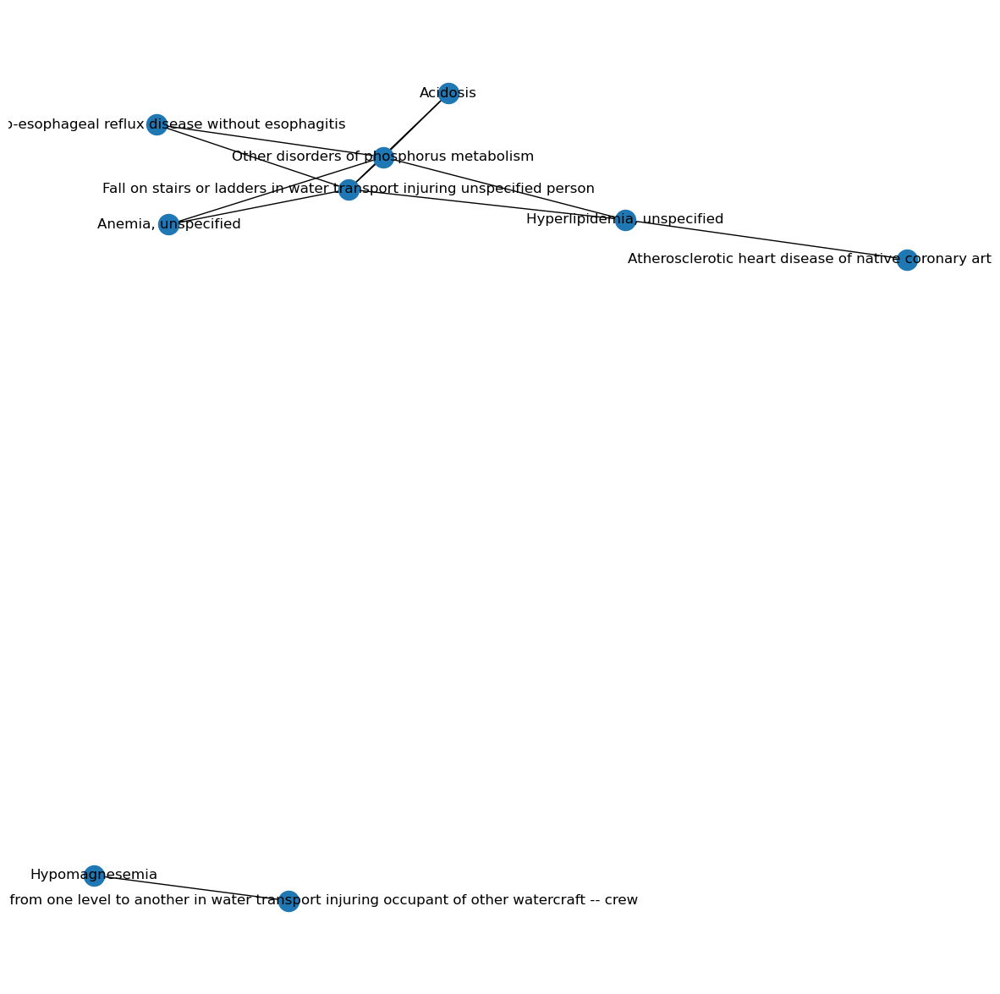

In [66]:
import networkx as nx
# Convert antecedents and consequents into strings
rules_fpg_cl1.antecedents = rules_fpg_cl1.antecedents.apply(lambda x: next(iter(x)))
rules_fpg_cl1.consequents = rules_fpg_cl1.consequents.apply(lambda x: next(iter(x)))

fig, ax=plt.subplots(figsize=(15,15))
GA=nx.from_pandas_edgelist(rules_fpg_cl1,source='antecedents',target='consequents')
nx.draw(GA,with_labels=True)
plt.show()

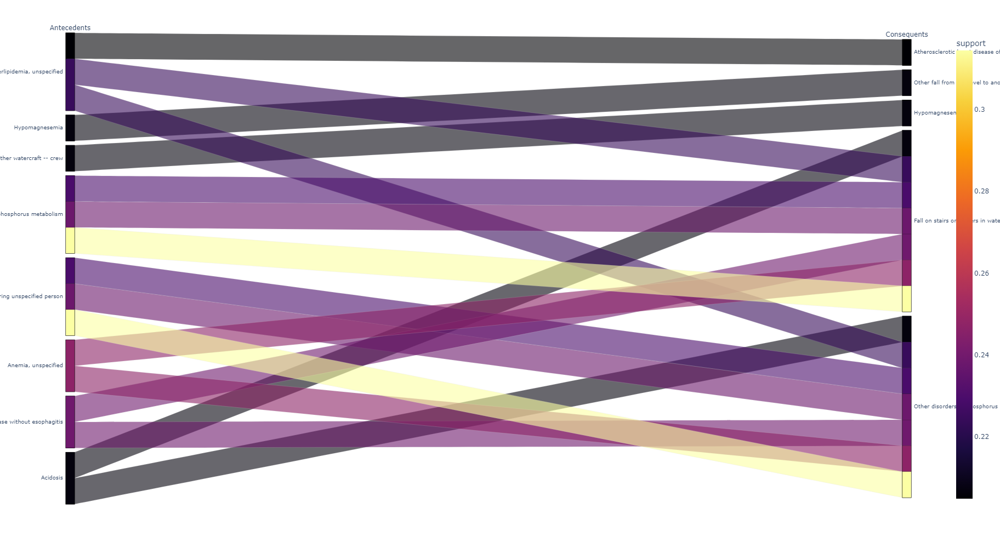

In [67]:
import plotly.express as px
pd.DataFrame.iteritems = pd.DataFrame.items

fig = px.parallel_categories(
    rules_fpg_cl1, 
    dimensions=['antecedents', 'consequents'],
    color="support", 
    color_continuous_scale=px.colors.sequential.Inferno,
    labels={'antecedents':'Antecedents', 'consequents':'Consequents'},
    width=1500, height=1000,
)
fig.show()

#### Cluster 2

In [68]:
# Selecting only cluster 2 patients
ccsr_clus_2 = ccsr_clus[ccsr_clus["k_means_5"] == 1 ]
ccsr_clus_2

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
0,10000084,23052089,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
1,10000084,23052089,2,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
2,10000084,29888819,3,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
3,10000084,23052089,3,R441,10,SYM015,Visual hallucinations,General sensation/perception signs and symptoms,General sensation/perception signs and symptom...,"SYM: Symptoms, signs and abnormal clinical and...",1
4,10000084,23052089,4,R296,10,SYM016,Repeated falls,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",1
...,...,...,...,...,...,...,...,...,...,...,...
2015196,19605111,27977609,12,E848,9,END012,Cystic fibrosis with other manifestations,Cystic fibrosis,"Other endocrine, nutritional & metabolic disor...","END: Endocrine, nutritional and metabolic dise...",1
2015197,19675719,22711055,15,E848,9,END012,"Accidents involving other vehicles, not elsewh...",Cystic fibrosis,"Other endocrine, nutritional & metabolic disor...","END: Endocrine, nutritional and metabolic dise...",1
2015198,19675719,22711055,15,E848,9,END012,Cystic fibrosis with other manifestations,Cystic fibrosis,"Other endocrine, nutritional & metabolic disor...","END: Endocrine, nutritional and metabolic dise...",1
2015199,11785127,26652615,2,O081,10,PRG007,Delayed or excessive hemorrhage following ecto...,Complications following ectopic and/or molar p...,"Complications of pregnancy/birth, and perinata...","PNL/PRG: Pregnancy, childbirth, puerperium and...",1


In [69]:
cl2= ccsr_clus_2.set_index(['subject_id', ccsr_clus_2.groupby('subject_id').cumcount()])['diagnose'].unstack().add_prefix('N.').reset_index()
cl2=cl2.stack().groupby(level=0).apply(list).tolist()
subject_ids_cl2 = [cl2[sublist][0] for sublist in range(len(cl2))]
for sublist in cl2:
    del sublist[0]

In [ ]:
tr_enc = TransactionEncoder()
tr_array_cl2 = tr_enc.fit(cl2).transform(cl2)
df_binary_cl2 = pd.DataFrame(tr_array_cl2,columns=[str(i) for i in tr_enc.columns_])
df_binary_cl2 = df_binary_cl2.replace(False,0)
FI_fpg_cl2 = fpgrowth(df_binary_cl2, min_support=0.2, use_colnames=True)
FI_fpg_cl2.sort_values(["support"], ascending=False)

In [71]:
rules_fpg_cl2 = association_rules(FI_fpg_cl2, metric="confidence", min_threshold=0.1)
rules_sort_cl2 = rules_fpg_cl2.sort_values(["confidence", "lift"], ascending=False)
pd.DataFrame(rules_sort_cl2) #.sort_values(["zhangs_metric"], ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric


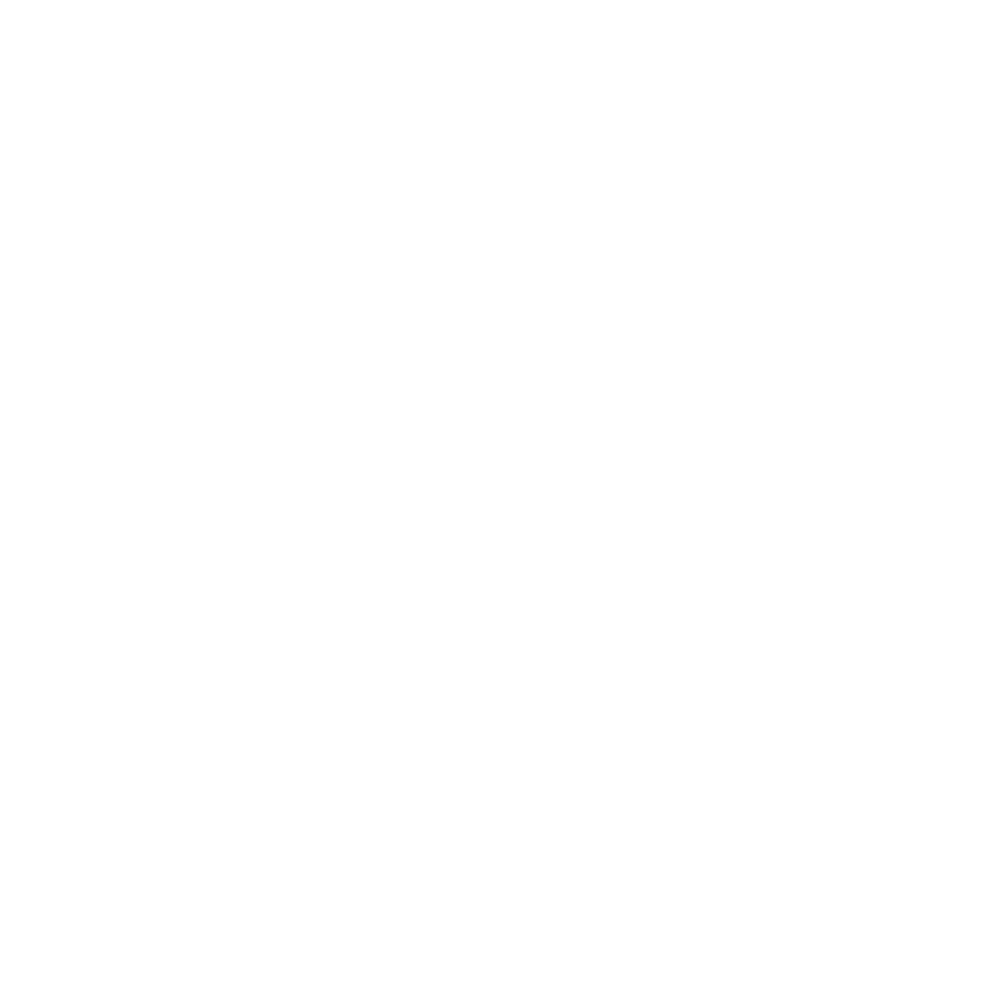

In [72]:
import networkx as nx
# Convert antecedents and consequents into strings
rules_fpg_cl2.antecedents = rules_fpg_cl2.antecedents.apply(lambda x: next(iter(x)))
rules_fpg_cl2.consequents = rules_fpg_cl2.consequents.apply(lambda x: next(iter(x)))

fig, ax=plt.subplots(figsize=(15,15))
GA=nx.from_pandas_edgelist(rules_fpg_cl2,source='antecedents',target='consequents')
nx.draw(GA,with_labels=True)
plt.show()

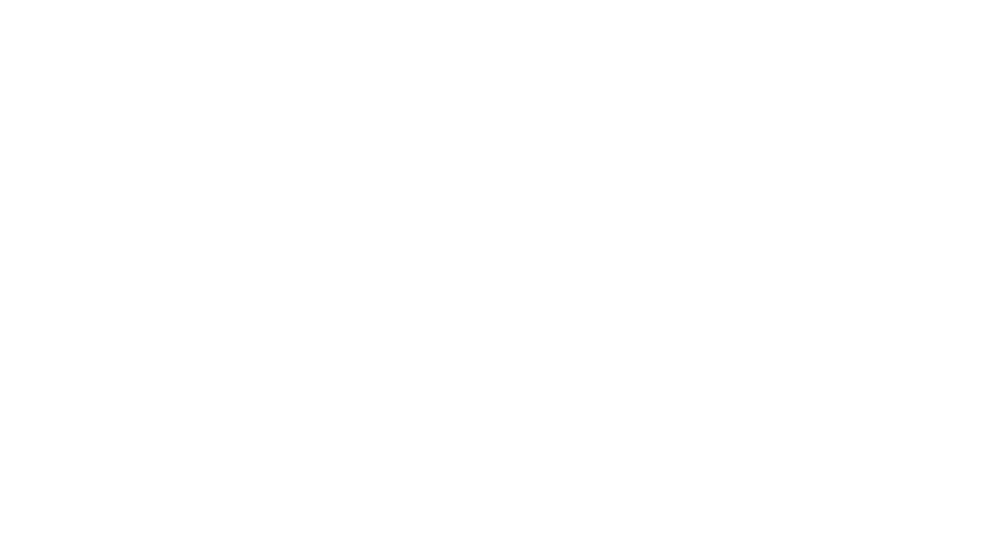

In [73]:
import plotly.express as px
pd.DataFrame.iteritems = pd.DataFrame.items

fig = px.parallel_categories(
    rules_fpg_cl2, 
    dimensions=['antecedents', 'consequents'],
    color="support", 
    color_continuous_scale=px.colors.sequential.Inferno,
    labels={'antecedents':'Antecedents', 'consequents':'Consequents'},
    width=1500, height=1000,
)
fig.show()

#### Cluster 3

In [74]:
# Selecting only cluster 3 patients
ccsr_clus_3 = ccsr_clus[ccsr_clus["k_means_5"] == 2 ]
ccsr_clus_3.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
2758,13150152,28707914,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,2
2759,13150152,28889072,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,2
2760,13150152,28707914,3,F0281,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,2
2761,13150152,28889072,2,F0281,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,2
2762,13150152,28707914,2,R64,10,SYM016,Cachexia,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",2


In [75]:
cl3= ccsr_clus_3.set_index(['subject_id', ccsr_clus_3.groupby('subject_id').cumcount()])['diagnose'].unstack().add_prefix('N.').reset_index()
cl3=cl3.stack().groupby(level=0).apply(list).tolist()
subject_ids_cl3 = [cl3[sublist][0] for sublist in range(len(cl3))]
for sublist in cl3:
    del sublist[0]

In [76]:
tr_enc = TransactionEncoder()
tr_array_cl3 = tr_enc.fit(cl3).transform(cl3)
df_binary_cl3 = pd.DataFrame(tr_array_cl3,columns=[str(i) for i in tr_enc.columns_])
df_binary_cl3 = df_binary_cl3.replace(False,0)
FI_fpg_cl3 = fpgrowth(df_binary_cl3, min_support=0.008, use_colnames=True)
FI_fpg_cl3.sort_values(["support"], ascending=False)

,support,itemsets
31,0.520602,(Unspecified street and highway as the place o...
0,0.296355,(Unspecified place or not applicable)
60,0.260697,(Essential (primary) hypertension)
64,0.163233,"(Hyperlipidemia, unspecified)"
37,0.154517,"(Nicotine dependence, cigarettes, uncomplicated)"
...,...,...
1682,0.008716,(Type 2 diabetes mellitus without complication...
792,0.008716,"(Anxiety disorder, unspecified, Anemia, unspec..."
794,0.008716,(Gastro-esophageal reflux disease without esop...
1678,0.008716,"(Essential (primary) hypertension, Unspecified..."


In [77]:
rules_fpg_cl3 = association_rules(FI_fpg_cl3, metric="confidence", min_threshold=1)
rules_sort_cl3 = rules_fpg_cl3.sort_values(["confidence", "lift"], ascending=False)
pd.DataFrame(rules_sort_cl3) #.sort_values(["zhangs_metric"], ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
30,(Other disorders of phosphorus metabolism),(Fall on stairs or ladders in water transport ...,0.010301,0.010301,0.010301,1.0,97.076923,0.010195,inf,1.000000
31,(Fall on stairs or ladders in water transport ...,(Other disorders of phosphorus metabolism),0.010301,0.010301,0.010301,1.0,97.076923,0.010195,inf,1.000000
6,(Patient room in hospital as the place of occu...,(Other medical procedures as the cause of abno...,0.009509,0.021395,0.009509,1.0,46.740741,0.009305,inf,0.988000
2,(Patient room in hospital as the place of occu...,(Other medical procedures as the cause of abno...,0.009509,0.026941,0.009509,1.0,37.117647,0.009253,inf,0.982400
5,(Patient room in hospital as the place of occu...,(Other medical procedures as the cause of abno...,0.009509,0.026941,0.009509,1.0,37.117647,0.009253,inf,0.982400
8,(Patient room in hospital as the place of occu...,(Other medical procedures as the cause of abno...,0.012678,0.026941,0.012678,1.0,37.117647,0.012337,inf,0.985554
29,"(Encounter for palliative care, Essential (pri...",(Do not resuscitate),0.009509,0.038035,0.009509,1.0,26.291667,0.009147,inf,0.971200
15,(Presence of aortocoronary bypass graft),(Atherosclerotic heart disease of native coron...,0.019810,0.064976,0.019810,1.0,15.390244,0.018523,inf,0.953921
16,"(Hyperlipidemia, unspecified, Presence of aort...",(Atherosclerotic heart disease of native coron...,0.013471,0.064976,0.013471,1.0,15.390244,0.012595,inf,0.947791
17,"(Presence of aortocoronary bypass graft, Essen...",(Atherosclerotic heart disease of native coron...,0.011094,0.064976,0.011094,1.0,15.390244,0.010373,inf,0.945513


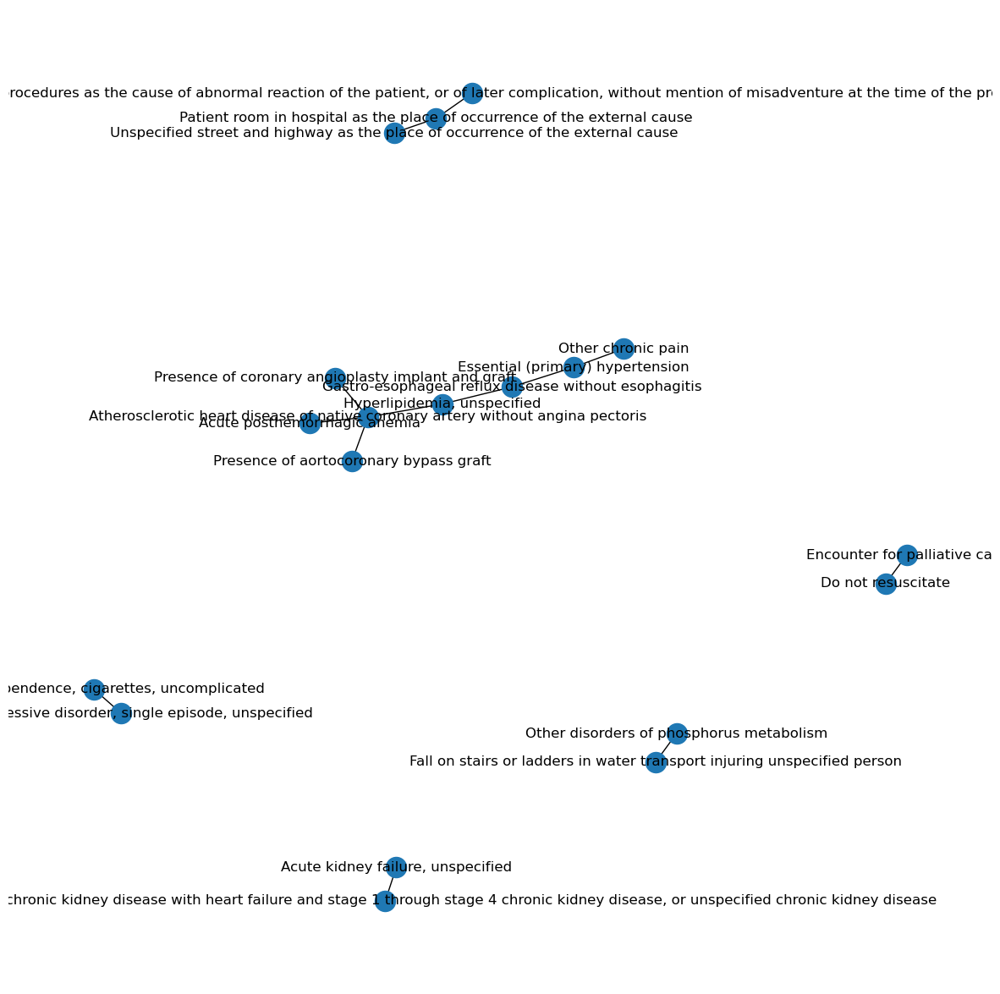

In [78]:
import networkx as nx
# Convert antecedents and consequents into strings
rules_fpg_cl3.antecedents = rules_fpg_cl3.antecedents.apply(lambda x: next(iter(x)))
rules_fpg_cl3.consequents = rules_fpg_cl3.consequents.apply(lambda x: next(iter(x)))

fig, ax=plt.subplots(figsize=(15,15))
GA=nx.from_pandas_edgelist(rules_fpg_cl3,source='antecedents',target='consequents')
nx.draw(GA,with_labels=True)
plt.show()

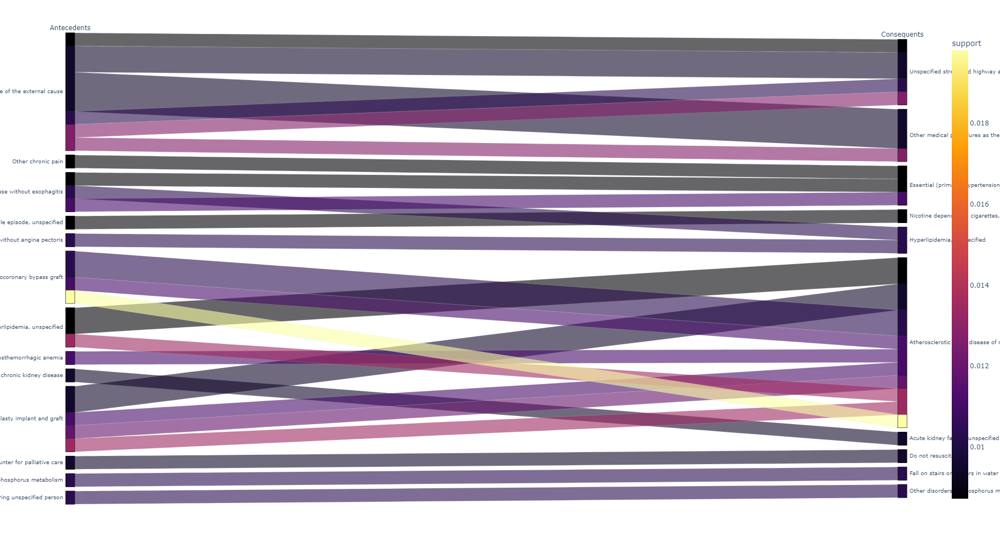

In [79]:
import plotly.express as px
pd.DataFrame.iteritems = pd.DataFrame.items

fig = px.parallel_categories(
    rules_fpg_cl3, 
    dimensions=['antecedents', 'consequents'],
    color="support", 
    color_continuous_scale=px.colors.sequential.Inferno,
    labels={'antecedents':'Antecedents', 'consequents':'Consequents'},
    width=1200, height=1000,
)
fig.show()

#### Cluster 4

In [80]:
# Selecting only cluster 4 patients
ccsr_clus_4 = ccsr_clus[ccsr_clus["k_means_5"] == 3 ]
ccsr_clus_4.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
176765,17732534,28321954,4,F05,10,NVS011,Delirium due to known physiological condition,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,3
176766,17732534,22394844,14,Z8489,10,FAC021,Family history of other specified conditions,Personal/family history of disease,Other care and screening,FAC: Factors influencing health status and con...,3
176767,17732534,22394844,13,R260,10,SYM010,Ataxic gait,Nervous system signs and symptoms,Nervous system signs and symptoms,"SYM: Symptoms, signs and abnormal clinical and...",3
176768,17732534,22394844,12,K219,10,DIG004,Gastro-esophageal reflux disease without esoph...,Esophageal disorders,Disorders of mouth and esophagus (including ac...,DIG: Diseases of the digestive system,3
176769,17732534,28321954,7,K219,10,DIG004,Gastro-esophageal reflux disease without esoph...,Esophageal disorders,Disorders of mouth and esophagus (including ac...,DIG: Diseases of the digestive system,3


In [81]:
cl4= ccsr_clus_4.set_index(['subject_id', ccsr_clus_4.groupby('subject_id').cumcount()])['diagnose'].unstack().add_prefix('N.').reset_index()
cl4=cl4.stack().groupby(level=0).apply(list).tolist()
subject_ids_cl4 = [cl2[sublist][0] for sublist in range(len(cl4))]
for sublist in cl4:
    del sublist[0]

In [82]:
tr_enc = TransactionEncoder()
tr_array_cl4 = tr_enc.fit(cl4).transform(cl4)
df_binary_cl4 = pd.DataFrame(tr_array_cl4,columns=[str(i) for i in tr_enc.columns_])
df_binary_cl4 = df_binary_cl4.replace(False,0)
FI_fpg_cl4 = fpgrowth(df_binary_cl4, min_support=0.05, use_colnames=True)
FI_fpg_cl4.sort_values(["support"], ascending=False)

,support,itemsets
0,0.968324,(Single live birth)
1,0.328089,(39 weeks gestation of pregnancy)
40,0.327250,"(39 weeks gestation of pregnancy, Single live ..."
7,0.311517,(Second degree perineal laceration during deli...
50,0.308370,"(Single live birth, Second degree perineal lac..."
...,...,...
92,0.052444,"(Single live birth, Anemia, unspecified)"
101,0.051605,"(Single live birth, 38 weeks gestation of preg..."
103,0.050975,"(Single live birth, Encounter for immunization)"
39,0.050766,"(Maternal care for breech presentation, not ap..."


In [83]:
rules_fpg_cl4 = association_rules(FI_fpg_cl4, metric="confidence", min_threshold=1)
rules_sort_cl4 = rules_fpg_cl4.sort_values(["confidence", "lift"], ascending=False)
pd.DataFrame(rules_sort_cl4) #.sort_values(["zhangs_metric"], ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,"(Full-term premature rupture of membranes, ons...",(Single live birth),0.064821,0.968324,0.064821,1.0,1.032712,0.002053,inf,0.033872
1,"(39 weeks gestation of pregnancy, Second degre...",(Single live birth),0.105517,0.968324,0.105517,1.0,1.032712,0.003342,inf,0.035413
2,(Post-term pregnancy),(Single live birth),0.138452,0.968324,0.138452,1.0,1.032712,0.004386,inf,0.036766
3,"(Post-term pregnancy, Second degree perineal l...",(Single live birth),0.057688,0.968324,0.057688,1.0,1.032712,0.001827,inf,0.033615
4,"(Post-term pregnancy, Abnormality in fetal hea...",(Single live birth),0.054961,0.968324,0.054961,1.0,1.032712,0.001741,inf,0.033518
5,"(40 weeks gestation of pregnancy, Post-term pr...",(Single live birth),0.068806,0.968324,0.068806,1.0,1.032712,0.002180,inf,0.034017
6,(41 weeks gestation of pregnancy),(Single live birth),0.087896,0.968324,0.087896,1.0,1.032712,0.002784,inf,0.034729
7,"(Post-term pregnancy, 41 weeks gestation of pr...",(Single live birth),0.075519,0.968324,0.075519,1.0,1.032712,0.002392,inf,0.034264
8,"(39 weeks gestation of pregnancy, Streptococcu...",(Single live birth),0.093350,0.968324,0.093350,1.0,1.032712,0.002957,inf,0.034938
9,"(39 weeks gestation of pregnancy, Maternal car...",(Single live birth),0.053073,0.968324,0.053073,1.0,1.032712,0.001681,inf,0.033451


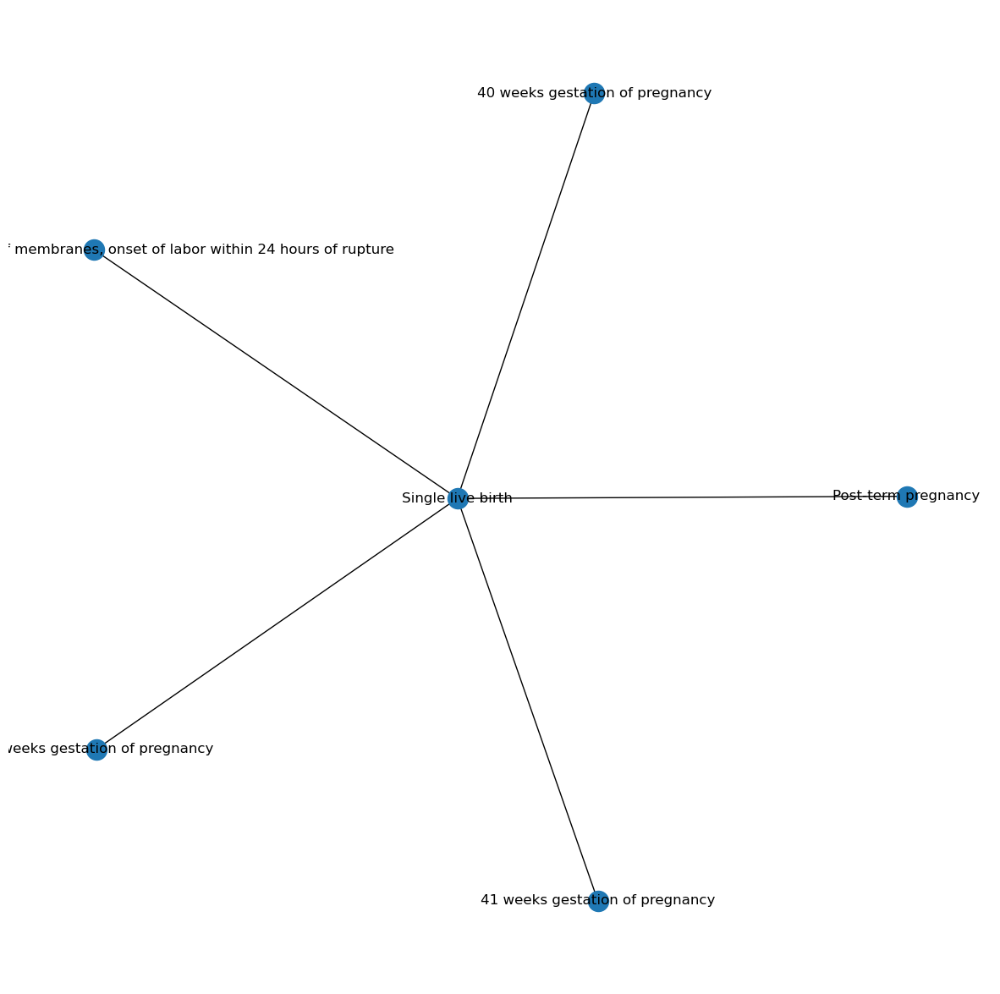

In [84]:
import networkx as nx
# Convert antecedents and consequents into strings
rules_fpg_cl4.antecedents = rules_fpg_cl4.antecedents.apply(lambda x: next(iter(x)))
rules_fpg_cl4.consequents = rules_fpg_cl4.consequents.apply(lambda x: next(iter(x)))

fig, ax=plt.subplots(figsize=(15,15))
GA=nx.from_pandas_edgelist(rules_fpg_cl4,source='antecedents',target='consequents')
nx.draw(GA,with_labels=True)
plt.show()

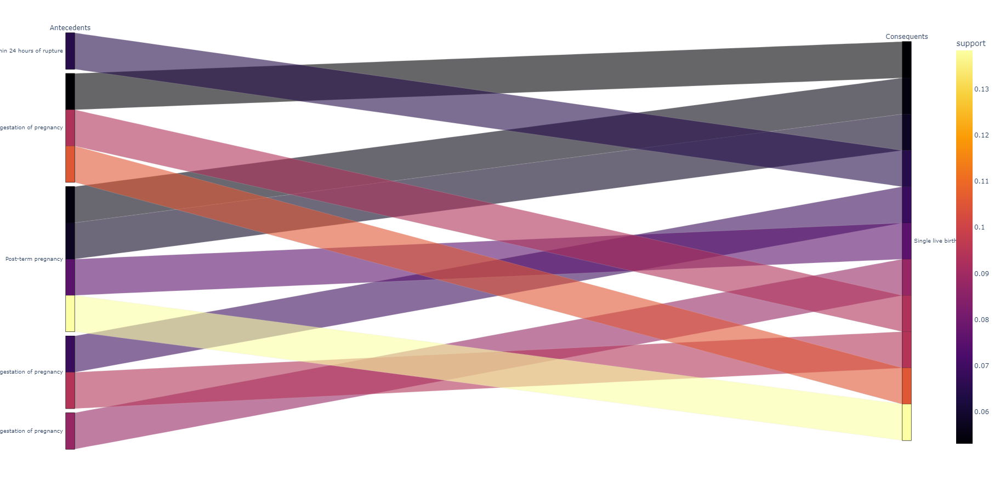

In [85]:
import plotly.express as px
pd.DataFrame.iteritems = pd.DataFrame.items

fig = px.parallel_categories(
    rules_fpg_cl4, 
    dimensions=['antecedents', 'consequents'],
    color="support", 
    color_continuous_scale=px.colors.sequential.Inferno,
    labels={'antecedents':'Antecedents', 'consequents':'Consequents'},
    width=1200, height=900,
)
fig.show()

#### Cluster 5

In [86]:
# Selecting only cluster 5 patients
ccsr_clus_5 = ccsr_clus[ccsr_clus["k_means_5"] == 4 ]
ccsr_clus_5.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
48,10279514,29624303,13,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,4
49,10279514,29624303,14,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,4
50,10279514,22201318,7,R627,10,SYM016,Adult failure to thrive,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",4
51,10279514,29624303,3,R627,10,SYM016,Adult failure to thrive,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",4
52,10279514,23578816,6,E785,10,END010,"Hyperlipidemia, unspecified",Disorders of lipid metabolism,Hyperlipidemia (High cholesterol),"END: Endocrine, nutritional and metabolic dise...",4


In [87]:
cl5= ccsr_clus_5.set_index(['subject_id', ccsr_clus_5.groupby('subject_id').cumcount()])['diagnose'].unstack().add_prefix('N.').reset_index()
cl5=cl5.stack().groupby(level=0).apply(list).tolist()
subject_ids_cl5 = [cl5[sublist][0] for sublist in range(len(cl5))]
for sublist in cl5:
    del sublist[0]

In [88]:
tr_enc = TransactionEncoder()
tr_array_cl5 = tr_enc.fit(cl5).transform(cl5)
df_binary_cl5 = pd.DataFrame(tr_array_cl5,columns=[str(i) for i in tr_enc.columns_])
df_binary_cl5 = df_binary_cl5.replace(False,0)
FI_fpg_cl5 = fpgrowth(df_binary_cl5, min_support=0.045, use_colnames=True)
FI_fpg_cl5.sort_values(["support"], ascending=False)

,support,itemsets
0,0.633469,"(Hyperlipidemia, unspecified)"
28,0.551640,(Essential (primary) hypertension)
29,0.503009,"(Acute kidney failure, unspecified)"
1,0.501359,(Personal history of nicotine dependence)
2,0.478257,(Gastro-esophageal reflux disease without esop...
...,...,...
2211,0.045040,"(Unspecified atrial fibrillation, Chronic dias..."
2923,0.045040,"(Toxic encephalopathy, Acidosis, Acute kidney ..."
1049,0.045040,(Gastro-esophageal reflux disease without esop...
2892,0.045040,"(Toxic encephalopathy, Type 2 diabetes mellitu..."


In [89]:
rules_fpg_cl5 = association_rules(FI_fpg_cl5, metric="confidence", min_threshold=1)
rules_sort_cl5 = rules_fpg_cl5.sort_values(["confidence", "lift"], ascending=False)
pd.DataFrame(rules_sort_cl5) #.sort_values(["zhangs_metric"], ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(Hypomagnesemia),(Other fall from one level to another in water...,0.086973,0.086973,0.086973,1.0,11.497768,0.079409,inf,1.000000
1,(Other fall from one level to another in water...,(Hypomagnesemia),0.086973,0.086973,0.086973,1.0,11.497768,0.079409,inf,1.000000
2,"(Hypomagnesemia, Essential (primary) hypertens...",(Other fall from one level to another in water...,0.053679,0.086973,0.053679,1.0,11.497768,0.049010,inf,0.964817
3,"(Essential (primary) hypertension, Other fall ...",(Hypomagnesemia),0.053679,0.086973,0.053679,1.0,11.497768,0.049010,inf,0.964817
4,"(Hypomagnesemia, Acute kidney failure, unspeci...",(Other fall from one level to another in water...,0.047855,0.086973,0.047855,1.0,11.497768,0.043693,inf,0.958915
5,(Other fall from one level to another in water...,(Hypomagnesemia),0.047855,0.086973,0.047855,1.0,11.497768,0.043693,inf,0.958915
6,"(Hyperlipidemia, unspecified, Hypomagnesemia)",(Other fall from one level to another in water...,0.046884,0.086973,0.046884,1.0,11.497768,0.042806,inf,0.957939
7,"(Hyperlipidemia, unspecified, Other fall from ...",(Hypomagnesemia),0.046884,0.086973,0.046884,1.0,11.497768,0.042806,inf,0.957939
8,(Gastro-esophageal reflux disease without esop...,(Other fall from one level to another in water...,0.046399,0.086973,0.046399,1.0,11.497768,0.042363,inf,0.957451
9,(Gastro-esophageal reflux disease without esop...,(Hypomagnesemia),0.046399,0.086973,0.046399,1.0,11.497768,0.042363,inf,0.957451


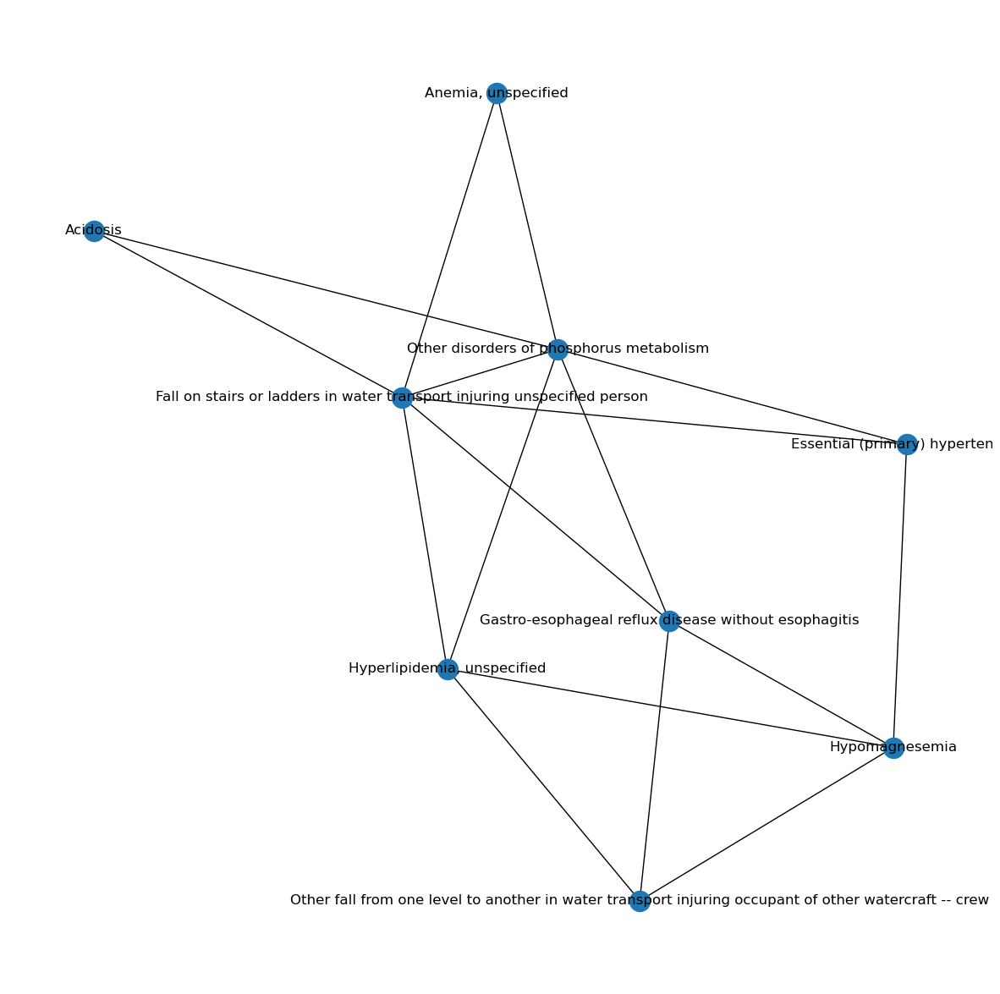

In [90]:
import networkx as nx
# Convert antecedents and consequents into strings
rules_fpg_cl5.antecedents = rules_fpg_cl5.antecedents.apply(lambda x: next(iter(x)))
rules_fpg_cl5.consequents = rules_fpg_cl5.consequents.apply(lambda x: next(iter(x)))

fig, ax=plt.subplots(figsize=(15,15))
GA=nx.from_pandas_edgelist(rules_fpg_cl5,source='antecedents',target='consequents')
nx.draw(GA,with_labels=True)
plt.show()

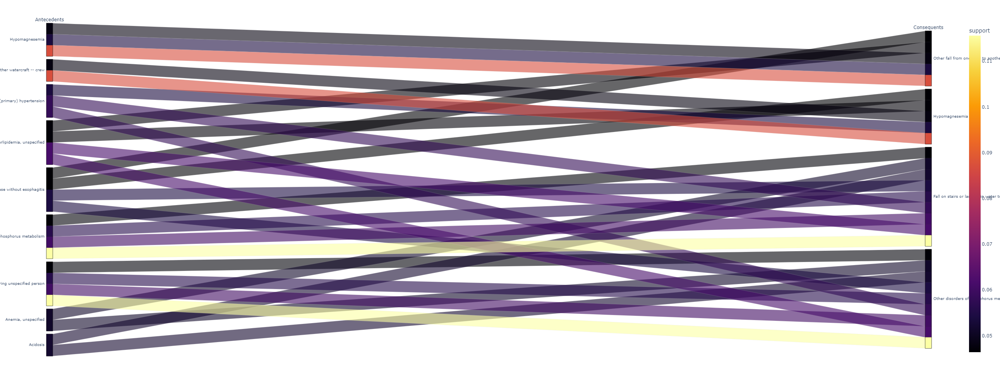

In [91]:
import plotly.express as px
pd.DataFrame.iteritems = pd.DataFrame.items

fig = px.parallel_categories(
    rules_fpg_cl5, 
    dimensions=['antecedents', 'consequents'],
    color="support", 
    color_continuous_scale=px.colors.sequential.Inferno,
    labels={'antecedents':'Antecedents', 'consequents':'Consequents'},
    width=1500, height=1000,
)
fig.show()

### Patient Diagnoses ICD codes

In [92]:
#Only for seq_num = 1

diag_icd_ = diag_icd[["subject_id","seq_num","icd_version","icd_code"]]
diag_icd_1=diag_icd_[diag_icd_["seq_num"] == 1 ]


In [93]:
diag_icd_1.head()

,subject_id,seq_num,icd_version,icd_code
0,10000032,1,9,5723
8,10000032,1,9,07071
16,10000032,1,9,07054
26,10000032,1,9,45829
39,10000068,1,9,30500


In [94]:
df2 = diag_icd_1.set_index(['subject_id', diag_icd_1.groupby('subject_id').cumcount()])['icd_code'].unstack().add_prefix('N.').reset_index()
df2=df2.stack().groupby(level=0).apply(list).tolist()

In [95]:
subject_ids_df2 = [df2[sublist][0] for sublist in range(len(df2))]
for sublist in df2:
    del sublist[0]

In [96]:
tr_enc = TransactionEncoder()
tr_array_df2 = tr_enc.fit(df2).transform(df2)
df_binary_df2=pd.DataFrame(tr_array_df2,columns=[str(i) for i in tr_enc.columns_])
df_binary_df2 = df_binary_df2.replace(False,0)
FI_fpg_df2 = fpgrowth(df_binary_df2, min_support=0.0001, use_colnames=True)
FI_fpg_df2.sort_values(["support"], ascending=False)

MemoryError: Unable to allocate 2.15 GiB for an array with shape (180640, 12808) and data type bool

In [ ]:
rules_fpg_df2 = association_rules(FI_fpg_df2, metric="confidence", min_threshold=0.9)
rules_sort_df2 = rules_fpg_df2.sort_values(["confidence", "lift"], ascending=False)

In [ ]:
pd.DataFrame(rules_sort_df2).head(10)

In [ ]:
import networkx as nx
# Create a directed graph
G = nx.DiGraph()

# Add nodes
for item in rules_fpg['antecedents']:
    G.add_node(tuple(item), shape='ellipse', style='filled', fillcolor='lightblue')
for item in rules_fpg['consequents']:
    G.add_node(tuple(item), shape='ellipse', style='filled', fillcolor='pink')

# Add edges
for idx, row in rules_fpg.iterrows():
    G.add_edge(tuple(row['antecedents']), tuple(row['consequents']), label=f"Confidence: {row['confidence']:.2f}")

# Plot the graph
pos = nx.spring_layout(G, seed=100)
edge_labels = nx.get_edge_attributes(G, 'label')
nx.draw(G, pos, with_labels=True, node_size=800, node_color=['lightblue' if 'antecedents' in node else 'pink' for node in G.nodes()])
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
plt.title("Association Rule Visualization")
plt.show()

In [ ]:
import networkx as nx
# Convert antecedents and consequents into strings
rules_sort_df2.antecedents = rules_sort_df2.antecedents.apply(lambda x: next(iter(x)))
rules_sort_df2.consequents = rules_sort_df2.consequents.apply(lambda x: next(iter(x)))

fig, ax=plt.subplots(figsize=(25,15))
G2=nx.from_pandas_edgelist(rules_sort_df2,source='antecedents',target='consequents')
nx.draw(G2,with_labels=True)
plt.show()

### Patient Diagnoses ICD codes merged with Diagnoses

In [ ]:
#diag_icd_1

#### Merge diag_icd_1 with icd_codes

In [ ]:
merge_diag = pd.merge(diag_icd_1,icd_diag,  on='icd_code', how='inner')
merge_diag.drop(columns = ['icd_version_y'], inplace=True)
merge_diag.rename(columns={'long_title': 'diagnose', 'icd_version_x': 'icd_version'}, inplace=True)
merge_diag.sort_values("subject_id").head()

In [ ]:
# Set all codes to IC10

In [ ]:
#!pip install icd-mappings
from icdmappings import Mapper

In [ ]:
#FROM IC10 TO CCSR
mapper = Mapper()
icd_codes_9 = merge_diag[merge_diag['icd_version'] == 9]['icd_code']
new_icd10_codes = mapper.map(icd_codes_9, source='icd9', target='icd10')
new_icd10_code= merge_diag.loc[merge_diag['icd_version'] == 9, 'icd_code']
merge_diag10=merge_diag
merge_diag10['icd10_code'] = new_icd10_code
merge_diag10 = merge_diag10.dropna() 

In [ ]:
merge_diag10=merge_diag10.drop(columns=["icd_code","icd_version"])

In [ ]:
merge_diag10.head()

In [ ]:
merge_diag10['subject_id'].nunique()

In [ ]:
Top_25_diagnoses = merge_diag10["diagnose"].value_counts().reset_index(name='number').head(25)
Top_25_diagnoses.head()

In [ ]:
plt.figure(figsize=(20,12))
colors=sns.color_palette('crest')
ax=sns.barplot(x="number",y="diagnose",data=Top_25_diagnoses,palette=colors)
for i in ax.containers:
    ax.bar_label(i)
plt.title("Top_25_diagnoses")
plt.show()

In [ ]:
diag_count = merge_diag10.groupby(['subject_id']).agg({'count'})['diagnose'].sort_values(['count'])

In [ ]:
diag_count.mean()

On average each pacient has ~2 diagnoses

In [ ]:
df3 = merge_diag10.set_index(['subject_id', merge_diag10.groupby('subject_id').cumcount()])['diagnose'].unstack().add_prefix('N.').reset_index()
df3=df3.stack().groupby(level=0).apply(list).tolist()

In [ ]:
subject_ids_df3 = [df3[sublist][0] for sublist in range(len(df3))]
for sublist in df3:
    del sublist[0]

In [ ]:
tr_enc = TransactionEncoder()
tr_array_df3 = tr_enc.fit(df3).transform(df3)
df_binary_df3=pd.DataFrame(tr_array_df3,columns=[str(i) for i in tr_enc.columns_])
df_binary_df3 = df_binary_df3.replace(False,0)
FI_fpg_df3 = fpgrowth(df_binary_df3, min_support=0.00001, use_colnames=True)

In [ ]:
FI_fpg_df3.sort_values(["support"], ascending=False)

In [ ]:
rules_fpg_df3 = association_rules(FI_fpg_df3, metric="confidence", min_threshold=0.6)
rules_sort_df3 = rules_fpg_df3.sort_values(["confidence", "lift"], ascending=False)

In [ ]:
pd.DataFrame(rules_sort_df3).head(15)

In [ ]:
import networkx as nx
# Convert antecedents and consequents into strings
rules_fpg_df3.antecedents = rules_fpg_df3.antecedents.apply(lambda x: next(iter(x)))
rules_fpg_df3.consequents = rules_fpg_df3.consequents.apply(lambda x: next(iter(x)))

fig, ax=plt.subplots(figsize=(15,8))
GA=nx.from_pandas_edgelist(rules_fpg_df3,source='antecedents',target='consequents')
nx.draw(GA,with_labels=True)
plt.show()

In [ ]:
import plotly.express as px
fig = px.parallel_categories(
    rules_fpg_df3, 
    dimensions=['antecedents', 'consequents'],
    color="support", 
    color_continuous_scale=px.colors.sequential.Inferno,
    labels={'antecedents':'Antecedents', 'consequents':'Consequents'},
)
fig.show()

In [ ]:
# Function to convert rules to coordinates.
def rules_to_coordinates(rules):
    rules['antecedent'] = rules['antecedents'].apply(lambda antecedent: list(antecedent)[0])
    rules['consequent'] = rules['consequents'].apply(lambda consequent: list(consequent)[0])
    rules['rule'] = rules.index
    return rules[['antecedent','consequent','rule']]

In [ ]:
from pandas.plotting import parallel_coordinates

# Compute the frequent itemsets
#frequent_itemsets = apriori(onehot, min_support = 0.15,use_colnames = True, max_len = 2)
# Compute rules from the frequent itemsets
#rules = association_rules(frequent_itemsets, metric = 'confidence', min_threshold = 0.55)

# Convert rules into coordinates suitable for use in a parallel coordinates plot
coords = rules_to_coordinates(rules_fpg_df3)

# Generate parallel coordinates plot
plt.figure(figsize=(20,15))
parallel_coordinates(coords, 'rule')
plt.legend([])
plt.grid(True)
plt.show()

In [ ]:
### Other dataframe

In [ ]:
df4 = diag_ccsr.set_index(['subject_id', diag_ccsr.groupby('subject_id').cumcount()])['diagnose'].unstack().add_prefix('N.').reset_index()
df4=df4.stack().groupby(level=0).apply(list).tolist()

In [ ]:
subject_ids_df4 = [df4[sublist][0] for sublist in range(len(df4))]
for sublist in df4:
    del sublist[0]

In [ ]:
tr_enc = TransactionEncoder()
tr_array_df4 = tr_enc.fit(df4).transform(df4)
df_binary_df4=pd.DataFrame(tr_array_df4,columns=[str(i) for i in tr_enc.columns_])
df_binary_df4 = df_binary_df4.replace(False,0)
FI_fpg_df4 = fpgrowth(df_binary_df4, min_support=0.0001, use_colnames=True)
rules_fpg_df4 = association_rules(FI_fpg_df4, metric="confidence", min_threshold=0.9)
rules_sort_df4 = rules_fpg_df4.sort_values(["confidence", "lift"], ascending=False)

In [ ]:
pd.DataFrame(rules_sort_df4).head(10)